In [99]:
import pandas as pd
import numpy as np

In [100]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [101]:
# MarketData.csv
#Accessing data sheet
df=pd.read_csv("drive/MyDrive/MarketData.csv")
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2000-01-03,1469.250000,1478.000000,1438.359985,1455.219971,1455.219971,931800000
1,2000-01-04,1455.219971,1455.219971,1397.430054,1399.420044,1399.420044,1009000000
2,2000-01-05,1399.420044,1413.270020,1377.680054,1402.109985,1402.109985,1085500000
3,2000-01-06,1402.109985,1411.900024,1392.099976,1403.449951,1403.449951,1092300000
4,2000-01-07,1403.449951,1441.469971,1400.729980,1441.469971,1441.469971,1225200000


In [102]:
df.info()#no null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5232 entries, 0 to 5231
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       5232 non-null   object 
 1   Open       5232 non-null   float64
 2   High       5232 non-null   float64
 3   Low        5232 non-null   float64
 4   Close      5232 non-null   float64
 5   Adj Close  5232 non-null   float64
 6   Volume     5232 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 286.2+ KB


In [103]:
df.describe()#general statistical behaviour of dataset

,Open,High,Low,Close,Adj Close,Volume
count,5232.000000,5232.000000,5232.000000,5232.000000,5232.000000,5.232000e+03
mean,1634.346903,1643.870727,1623.976516,1634.527020,1634.527020,3.164975e+09
std,649.457995,651.384321,647.211263,649.548486,649.548486,1.516307e+09
min,679.280029,695.270020,666.789978,676.530029,676.530029,3.560700e+08
25%,1161.485016,1169.445007,1151.432464,1161.425019,1161.425019,1.732522e+09
50%,1379.804993,1390.145019,1370.369995,1380.025024,1380.025024,3.270445e+09
75%,2059.962463,2070.492614,2045.802521,2059.942566,2059.942566,3.990660e+09
max,3564.739990,3588.110107,3535.229980,3580.840088,3580.840088,1.145623e+10


In [104]:
#converting object datatype Date column to datetime column
# adding the yearm month week and date columns to the dataset
df['Date'] = pd.to_datetime(df['Date'], format="%Y/%m/%d")
df['year'] = pd.DatetimeIndex(df['Date']).year
df['month'] = pd.DatetimeIndex(df['Date']).month
df['date'] = pd.DatetimeIndex(df['Date']).day
df['Week'] = pd.to_datetime(df.Date).dt.week

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  import sys


In [105]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume,year,month,date,Week
count,5232.000000,5232.000000,5232.000000,5232.000000,5232.000000,5.232000e+03,5232.000000,5232.000000,5232.000000,5232.000000
mean,1634.346903,1643.870727,1623.976516,1634.527020,1634.527020,3.164975e+09,2009.906728,6.494839,15.731843,26.444954
std,649.457995,651.384321,647.211263,649.548486,649.548486,1.516307e+09,6.001792,3.410652,8.753127,14.879778
min,679.280029,695.270020,666.789978,676.530029,676.530029,3.560700e+08,2000.000000,1.000000,1.000000,1.000000
25%,1161.485016,1169.445007,1151.432464,1161.425019,1161.425019,1.732522e+09,2005.000000,4.000000,8.000000,14.000000
50%,1379.804993,1390.145019,1370.369995,1380.025024,1380.025024,3.270445e+09,2010.000000,6.500000,16.000000,26.000000
75%,2059.962463,2070.492614,2045.802521,2059.942566,2059.942566,3.990660e+09,2015.000000,9.000000,23.000000,39.000000
max,3564.739990,3588.110107,3535.229980,3580.840088,3580.840088,1.145623e+10,2020.000000,12.000000,31.000000,53.000000


Text(0.5, 1.0, 'Lineplot:Examining the daily volume data')

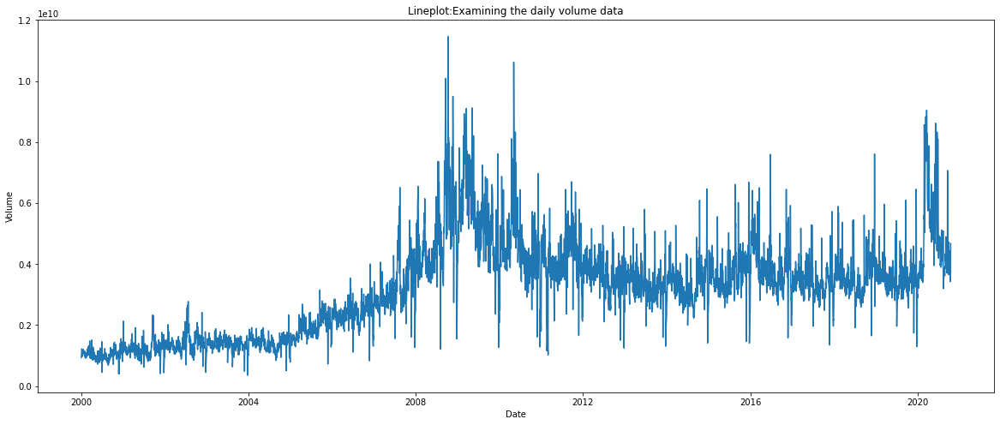

In [106]:
import matplotlib.pyplot as plt
import seaborn as sns
# figure size
plt.figure(figsize=(20,8))
# simple barplot
ax = sns.lineplot(x='Date', y='Volume', ci=None, data=df)#
ax.set_title('Lineplot:Examining the daily volume data')

In [110]:
#Identify the optimal number of clusters for daily volume data
#dataset
X=df[['Volume']]
X

,Volume
0,931800000
1,1009000000
2,1085500000
3,1092300000
4,1225200000
...,...
5227,3428970000
5228,3605150000
5229,3840630000
5230,3717640000


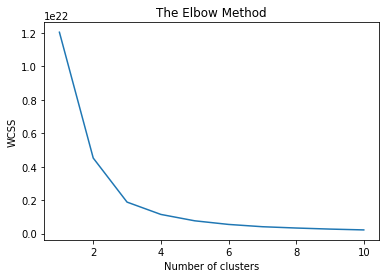

In [111]:
#elbow method
from sklearn.cluster import KMeans
wcss=[]
for i in range (1,11):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()#the optimal number of clusters for daily volume data could be taken as 5

,Open,Close,Volume,High
Date,,,,
2000-01-03,1469.250000,1455.219971,931800000,1478.000000
2000-01-04,1455.219971,1399.420044,1009000000,1455.219971
2000-01-05,1399.420044,1402.109985,1085500000,1413.270020
2000-01-06,1402.109985,1403.449951,1092300000,1411.900024
2000-01-07,1403.449951,1441.469971,1225200000,1441.469971


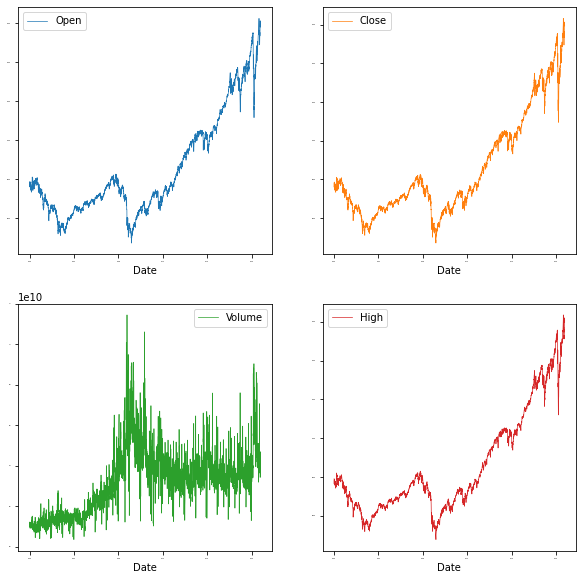

In [11]:
#Examining daily open close high and volume data
#Plotting all the time series data with data on x axis and jobs_subset on y axis
#all gender included here
# A subset of the jobs DataFrame
dff=df[['Date','Open', 'Close', 'Volume','High']]
dff.set_index('Date', inplace=True)
dff.reset_index()
jobs_subset = dff[['Open', 'Close', 'Volume','High']]

# Print the first 5 rows of jobs_subset
display(jobs_subset.head())

# Create a facetted graph with 2 rows and 2 columns
ax = jobs_subset.plot(subplots=True,
                      layout=(2,2),
                      sharex=False,
                      sharey=False,
                      linewidth=0.7,
                      fontsize=1.5,
                      legend=True,
                      figsize=(10,10))

plt.show()#We can see spikes in our data, it may belong to specific events

In [112]:
# Compute the fractional difference between current day open and previous day open
df['FD1']=(df['Open']/df['Open'].shift(1))-1

In [113]:
# Compute the fractional difference between current day open and current day close
df['FD2']=(df['Open']/df['Close'])-1

In [114]:
# Compute the fractional difference between current day volume and previous day
df['FD3']=(df['Volume']/df['Volume'].shift(1))-1

In [115]:
df = df.dropna(how='any',axis=0) #Drop any row with null
df.head()

,Date,Open,High,Low,Close,Adj Close,Volume,year,month,date,Week,FD1,FD2,FD3
1,2000-01-04,1455.219971,1455.219971,1397.430054,1399.420044,1399.420044,1009000000,2000,1,4,1,-0.009549,0.039874,0.082850
2,2000-01-05,1399.420044,1413.270020,1377.680054,1402.109985,1402.109985,1085500000,2000,1,5,1,-0.038345,-0.001918,0.075818
3,2000-01-06,1402.109985,1411.900024,1392.099976,1403.449951,1403.449951,1092300000,2000,1,6,1,0.001922,-0.000955,0.006264
4,2000-01-07,1403.449951,1441.469971,1400.729980,1441.469971,1441.469971,1225200000,2000,1,7,1,0.000956,-0.026376,0.121670
5,2000-01-10,1441.469971,1464.359985,1441.469971,1457.599976,1457.599976,1064800000,2000,1,10,2,0.027090,-0.011066,-0.130917


In [117]:
# How can you cluster the above data set (Parameters FD1, FD2, FD3)?->can use k means clustering
#dataset
X=df[['FD1','FD2','FD3']]
X

,FD1,FD2,FD3
1,-0.009549,0.039874,0.082850
2,-0.038345,-0.001918,0.075818
3,0.001922,-0.000955,0.006264
4,0.000956,-0.026376,0.121670
5,0.027090,-0.011066,-0.130917
...,...,...,...
5227,0.011663,-0.009677,-0.129495
5228,0.009711,0.006287,0.051380
5229,-0.005246,0.007682,0.065318
5230,-0.017565,-0.008503,-0.032023


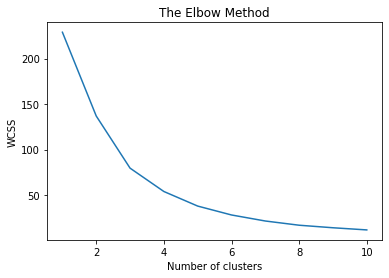

In [118]:
#elbow method
from sklearn.cluster import KMeans
wcss=[]
for i in range (1,11):
    kmeans=KMeans(n_clusters=i,init='k-means++',random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()#Clustering FD1,FD2 and FD3->optimum clusters comes out to be between 6-8.

In [120]:
# Fitting K-Means to the dataset
kmeans = KMeans(n_clusters = 6, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(X)
print(y_kmeans)

[0 0 0 ... 0 0 1]


In [121]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume,year,month,date,Week,FD1,FD2,FD3
count,5231.000000,5231.000000,5231.000000,5231.000000,5231.000000,5.231000e+03,5231.000000,5231.000000,5231.000000,5231.000000,5231.000000,5231.000000,5231.000000
mean,1634.378464,1643.902436,1624.012000,1634.561297,1634.561297,3.165401e+09,2009.908622,6.495890,15.734276,26.449818,0.000234,-0.000037,0.018306
std,649.516069,651.442553,647.268045,649.605848,649.605848,1.516138e+09,6.000802,3.410132,8.752193,14.877040,0.011700,0.011579,0.208562
min,679.280029,695.270020,666.789978,676.530029,676.530029,3.560700e+08,2000.000000,1.000000,1.000000,1.000000,-0.087119,-0.097383,-0.761155
25%,1161.460022,1169.380005,1151.424988,1161.340027,1161.340027,1.735765e+09,2005.000000,4.000000,8.000000,14.000000,-0.004640,-0.005259,-0.080517
50%,1379.750000,1390.060059,1370.349976,1380.020020,1380.020020,3.270860e+09,2010.000000,7.000000,16.000000,26.000000,0.000715,-0.000526,-0.001074
75%,2059.984985,2070.615112,2045.835022,2060.065064,2060.065064,3.990670e+09,2015.000000,9.000000,23.000000,39.000000,0.005559,0.004526,0.093066
max,3564.739990,3588.110107,3535.229980,3580.840088,3580.840088,1.145623e+10,2020.000000,12.000000,31.000000,53.000000,0.106712,0.095567,3.234605


In [ ]:
# ○ Use decision tree to classify if investing in any month can be a profitable strategy
# ○ What are the error metrics of your model?
# ○ Hint: Monthly returns = [Closing price (last day) / Closing price (first day)] - 1

In [17]:
def total_return(prices):
    """Retuns the return between the first and last value of the DataFrame.
    Parameters
    ----------
    prices : pandas.Series or pandas.DataFrame
    Returns
    -------
    total_return : float or pandas.Series
        Depending on the input passed returns a float or a pandas.Series.
    """
    return prices.iloc[-1] / prices.iloc[0] - 1

In [122]:
# Hint: Monthly returns = [Closing price (last day) / Closing price (first day)] - 1
df1 = df.groupby(['year', 'month'])['Close'].apply(total_return)
df1.head(20)

year  month
2000  1       -0.003544
      2       -0.030413
      3        0.086565
      4       -0.035552
      5       -0.032454
      6        0.003996
      7       -0.026342
      8        0.055337
      9       -0.055406
      10      -0.004755
      11      -0.074774
      12       0.003840
2001  1        0.064476
      2       -0.097221
      3       -0.065177
      4        0.090403
      5       -0.008386
      6       -0.028786
      7       -0.020611
      8       -0.067726
Name: Close, dtype: float64

In [19]:
dff=df[['Date','Open','Close']]
dff.head()

,Date,Open,Close
1,2000-01-04,1455.219971,1399.420044
2,2000-01-05,1399.420044,1402.109985
3,2000-01-06,1402.109985,1403.449951
4,2000-01-07,1403.449951,1441.469971
5,2000-01-10,1441.469971,1457.599976


In [20]:
dff["Date"] = pd.to_datetime(dff["Date"])
dff.set_index("Date", inplace=True)
dff = dff.groupby([dff.index.year, dff.index.month]).agg(["first", "last"])
# fractional difference between the month’s closing price and opening price
dff["returns"] = (dff[("Close", "last")] - dff[("Open", "first")])/dff[("Open", "first")]#monthly returns i.e., fractional difference between the
# month’s closing price and opening price
dff.index.rename(["year", "month"], inplace=True)
dff.reset_index(inplace=True)
dff
# You need to use groupby and agg function in order to get the first and last value of each column in each month:
# https://stackoverflow.com/questions/71614942/get-the-first-and-the-last-day-of-a-month-from-the-df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


year month         Open                     Close                returns
                       first         last        first         last          
0    2000     1  1455.219971  1360.160034  1399.420044  1394.459961 -0.041753
1    2000     2  1394.459961  1348.050049  1409.280029  1366.420044 -0.020108
2    2000     3  1366.420044  1487.920044  1379.189941  1498.579956  0.096720
3    2000     4  1498.579956  1464.920044  1505.969971  1452.430054 -0.030796
4    2000     5  1452.430054  1422.439941  1468.250000  1420.599976 -0.021915
..    ...   ...          ...          ...          ...          ...       ...
245  2020     6  3038.780029  3050.199951  3055.729980  3100.290039  0.020242
246  2020     7  3105.919922  3270.449951  3115.860107  3271.120117  0.053189
247  2020     8  3288.260010  3509.729980  3294.610107  3500.310059  0.064487
248  2020     9  3507.439941  3341.209961  3526.649902  3363.000000 -0.041181
249  2020    10  3385.870117  3493.500000  3380.800049  3483.810059  0.028926

[250 rows x 7 columns]

In [21]:
#Use decision tree to classify if investing in any month can be a profitable strategy
dff.describe()

year       month         Open                     Close  \
                                      first         last        first   
count   250.000000  250.000000   250.000000   250.000000   250.000000   
mean   2009.920000    6.460000  1633.027195  1640.978314  1634.785644   
std       6.024848    3.443229   648.517843   658.575151   648.615754   
min    2000.000000    1.000000   729.570007   749.929993   700.820007   
25%    2005.000000    3.250000  1157.719971  1150.944977  1157.242493   
50%    2010.000000    6.000000  1390.214966  1388.244995  1396.065002   
75%    2015.000000    9.000000  2064.059997  2072.832459  2059.317444   
max    2020.000000   12.000000  3507.439941  3509.729980  3526.649902   

                       returns  
              last              
count   250.000000  250.000000  
mean   1640.534760    0.004242  
std     657.856370    0.044149  
min     735.090027   -0.167862  
25%    1157.719971   -0.017744  
50%    1390.024964    0.009475  
75%    2064.752564    0.029386  
max    3500.310059    0.165867

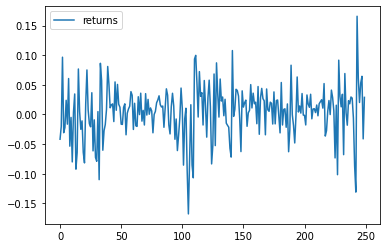

In [22]:
dff.plot(y='returns', use_index=True)

In [123]:
#We will use df1 here to build a model
df1 = pd.DataFrame(df1).reset_index()
df1.columns = ['year', 'month','returns']
df1['Class'] = np.where(df1['returns']>0, 1, 0)#if return >0, label 1 else label 0.
df1.head(20)

,year,month,returns,Class
0,2000,1,-0.003544,0
1,2000,2,-0.030413,0
2,2000,3,0.086565,1
3,2000,4,-0.035552,0
4,2000,5,-0.032454,0
5,2000,6,0.003996,1
6,2000,7,-0.026342,0
7,2000,8,0.055337,1
8,2000,9,-0.055406,0
9,2000,10,-0.004755,0


In [36]:
df1['Class'].value_counts()#How many 1 and how many 0 in Class

1    144
0    106
Name: Class, dtype: int64

In [37]:
df1.groupby('month').agg({'Class': sum})#summing class for each month

,Class
month,
1,10
2,10
3,13
4,14
5,11
6,8
7,12
8,12
9,12


In [ ]:
#We can see the most positive returns from december i.e 15. It supports our statement that “Santa brings the Christmas rally”.

Text(0.5, 1.0, 'Barplot')

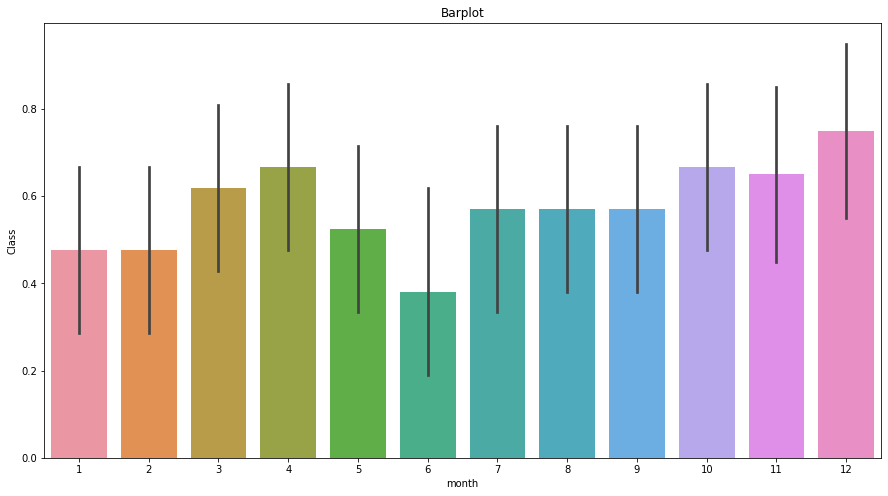

In [40]:
plt.figure(figsize=(15,8))

# simple barplot
ax = sns.barplot(x='month', y='Class', data=df1)
#Cumulative plot
ax.set_title('Barplot')#we get the avg class for each month

Text(0.5, 1.0, 'Barplot')

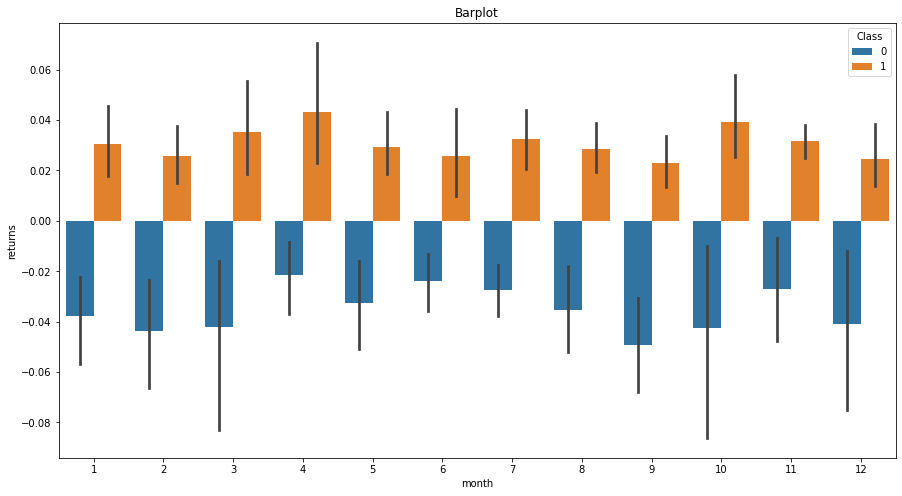

In [125]:
plt.figure(figsize=(15,8))

# simple barplot
ax = sns.barplot(x='month', y='returns', hue='Class', data=df1)
#Cumulative plot
ax.set_title('Barplot')#we get the avg class for each month

Text(0.5, 1.0, 'Barplot')

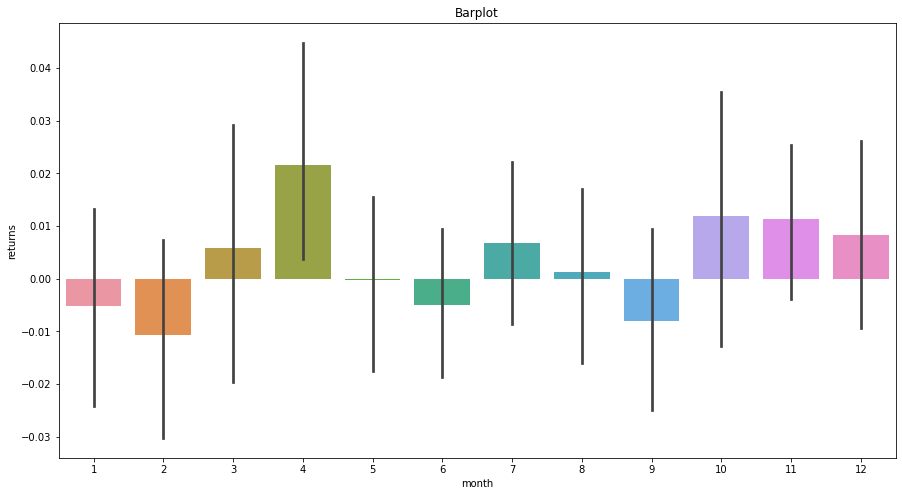

In [41]:
plt.figure(figsize=(15,8))

# simple barplot
ax = sns.barplot(x='month', y='returns', data=df1)
#Cumulative plot
ax.set_title('Barplot')#Avg return is maximum in april month.
#Keep in mind that our 2020 data doesn't have complete data for 10th 11th and 12th month.

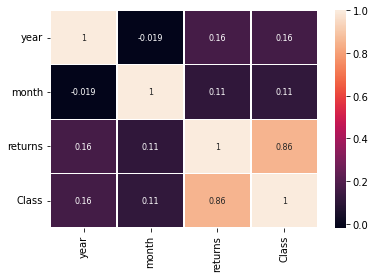

In [43]:
# Get correlation matrix of the df DataFrame
corr_meat = df1.corr(method='spearman')


# Customize the heatmap of the corr_meat correlation matrix
sns.heatmap(corr_meat,
            annot=True,
            linewidths=0.2,
            annot_kws={"size": 8})

plt.xticks(rotation=90)
plt.yticks(rotation=0) 
plt.show()

In [47]:
df2 = pd.merge(df, df1, on=['year', 'month'], how='left')#we get the dataframe on which we will build the model to predict the class
df2.head()

,Date,Open,High,Low,Close,Adj Close,Volume,year,month,date,Week,FD1,FD2,FD3,returns,Class
0,2000-01-04,1455.219971,1455.219971,1397.430054,1399.420044,1399.420044,1009000000,2000,1,4,1,-0.009549,0.039874,0.082850,-0.003544,0
1,2000-01-05,1399.420044,1413.270020,1377.680054,1402.109985,1402.109985,1085500000,2000,1,5,1,-0.038345,-0.001918,0.075818,-0.003544,0
2,2000-01-06,1402.109985,1411.900024,1392.099976,1403.449951,1403.449951,1092300000,2000,1,6,1,0.001922,-0.000955,0.006264,-0.003544,0
3,2000-01-07,1403.449951,1441.469971,1400.729980,1441.469971,1441.469971,1225200000,2000,1,7,1,0.000956,-0.026376,0.121670,-0.003544,0
4,2000-01-10,1441.469971,1464.359985,1441.469971,1457.599976,1457.599976,1064800000,2000,1,10,2,0.027090,-0.011066,-0.130917,-0.003544,0


In [50]:
df2.describe()

,Open,High,Low,Close,Adj Close,Volume,year,month,date,Week,FD1,FD2,FD3,returns,Class
count,5231.000000,5231.000000,5231.000000,5231.000000,5231.000000,5.231000e+03,5231.000000,5231.000000,5231.000000,5231.000000,5231.000000,5231.000000,5231.000000,5231.000000,5231.000000
mean,1634.378464,1643.902436,1624.012000,1634.561297,1634.561297,3.165401e+09,2009.908622,6.495890,15.734276,26.449818,0.000234,-0.000037,0.018306,0.003263,0.576754
std,649.516069,651.442553,647.268045,649.605848,649.605848,1.516138e+09,6.000802,3.410132,8.752193,14.877040,0.011700,0.011579,0.208562,0.044580,0.494121
min,679.280029,695.270020,666.789978,676.530029,676.530029,3.560700e+08,2000.000000,1.000000,1.000000,1.000000,-0.087119,-0.097383,-0.761155,-0.165633,0.000000
25%,1161.460022,1169.380005,1151.424988,1161.340027,1161.340027,1.735765e+09,2005.000000,4.000000,8.000000,14.000000,-0.004640,-0.005259,-0.080517,-0.020812,0.000000
50%,1379.750000,1390.060059,1370.349976,1380.020020,1380.020020,3.270860e+09,2010.000000,7.000000,16.000000,26.000000,0.000715,-0.000526,-0.001074,0.007456,1.000000
75%,2059.984985,2070.615112,2045.835022,2060.065064,2060.065064,3.990670e+09,2015.000000,9.000000,23.000000,39.000000,0.005559,0.004526,0.093066,0.026448,1.000000
max,3564.739990,3588.110107,3535.229980,3580.840088,3580.840088,1.145623e+10,2020.000000,12.000000,31.000000,53.000000,0.106712,0.095567,3.234605,0.178883,1.000000


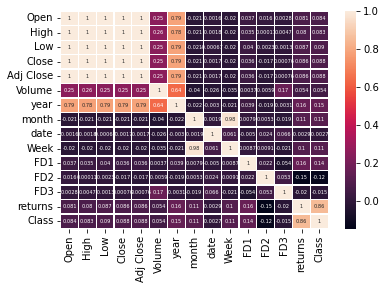

In [53]:
# Get correlation matrix of the df DataFrame
corr_meat = df2.corr(method='spearman')


# Customize the heatmap of the corr_meat correlation matrix
sns.heatmap(corr_meat,
            annot=True,
            linewidths=0.2,
            annot_kws={"size": 5})

plt.xticks(rotation=90)
plt.yticks(rotation=0) 
plt.show()#We get 1 correlation between some column, we can drop them

In [82]:
# Building model
# Split the data set into training data and test data
from sklearn.model_selection import train_test_split
x = df2.drop(['Class','Open','High','Low','Close','Adj Close','Date','returns'], axis = 1)
y = df2['Class']
x_training_data, x_test_data, y_training_data, y_test_data = train_test_split(x, y, test_size = 0.3)

In [83]:
#Train the decision tree model
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier()
model.fit(x_training_data, y_training_data)
predictions = model.predict(x_test_data)

In [84]:
#Measure the performance of the decision tree model
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
print(classification_report(y_test_data, predictions))
print(confusion_matrix(y_test_data, predictions))#error metrics of model->confusion metric, f-1 score, precision, recall
#our confusion metric is not v.good

              precision    recall  f1-score   support

           0       0.70      0.72      0.71       659
           1       0.79      0.77      0.78       911

    accuracy                           0.75      1570
   macro avg       0.74      0.75      0.75      1570
weighted avg       0.75      0.75      0.75      1570

[[473 186]
 [205 706]]


In [89]:
import graphviz
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn import tree
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

In [78]:
feature_name=list(x.columns)
class_name = list(y_training_data.unique())
feature_name

['Volume', 'year', 'month', 'date', 'Week', 'FD1', 'FD2', 'FD3']

In [90]:
# create a dot_file which stores the tree structure
dot_data = export_graphviz(model,feature_names = feature_name,rounded = True,filled = True)
# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)  
graph.write_png("myTree.png")
# Show graph
Image(graph.create_png())

In [92]:
#Lets use cross validation to get a better model
# we are tuning three hyperparameters right now, we are passing the different values for both parameters
grid_param = {
    'criterion': ['gini', 'entropy'],
    'max_depth' : range(2,32,1),
    'min_samples_leaf' : range(1,10,1),
    'min_samples_split': range(2,10,1),
    'splitter' : ['best', 'random']
    
}
grid_search = GridSearchCV(estimator=model,
                     param_grid=grid_param,
                     cv=5,
                    n_jobs =-1)
grid_search.fit(x_training_data,y_training_data)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 32),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [93]:
best_parameters = grid_search.best_params_
print(best_parameters)

{'criterion': 'entropy', 'max_depth': 31, 'min_samples_leaf': 2, 'min_samples_split': 8, 'splitter': 'random'}


In [94]:
grid_search.best_score_


0.8983923392898412

In [95]:
clf = DecisionTreeClassifier(criterion = 'entropy', max_depth =31, min_samples_leaf= 2, min_samples_split= 8, splitter ='random')
clf.fit(x_training_data,y_training_data)

DecisionTreeClassifier(criterion='entropy', max_depth=31, min_samples_leaf=2,
                       min_samples_split=8, splitter='random')

In [96]:
clf.score(x_test_data,y_test_data)#we improved our score

0.9299363057324841

In [98]:
predictions = clf.predict(x_test_data)
print(classification_report(y_test_data, predictions))
print(confusion_matrix(y_test_data, predictions))#error metrics of model is now much better

              precision    recall  f1-score   support

           0       0.91      0.93      0.92       659
           1       0.95      0.93      0.94       911

    accuracy                           0.93      1570
   macro avg       0.93      0.93      0.93      1570
weighted avg       0.93      0.93      0.93      1570

[[611  48]
 [ 62 849]]


In [97]:
feature_name=list(x.columns)
class_name = list(y_training_data.unique())
# create a dot_file which stores the tree structure
dot_data = export_graphviz(clf,rounded = True,filled = True)
# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)  
#graph.write_png("tree.png")
# Show graph
Image(graph.create_png())